## Import Necessary Libaries and Define a Few Helper Functions

In [1]:
import os
import openai
import itertools
import random

import requests
import uuid
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

from PIL import Image, ImageDraw
import math
openai.api_key =  os.environ["OPENAI_API_KEY"]
openai.Model.list()
# Functions
def ask_gpt(prompt):
    response = openai.Completion.create(
        engine="text-davinci-003",  # use the latest model available to you
        prompt=prompt,
        max_tokens=200, 
    )
    output_text_parsed = response.choices[0].text.strip()
    print(output_text_parsed)
    return response
# make a uniqueish string to label images as they are generated
def generate_uniqueish_string():
    return str(uuid.uuid4())[:8]

def process_dalle_images(response, filename, image_dir, i, hash = True):
    # save the images
    uid = generate_uniqueish_string()
    urls = [datum["url"] for datum in response["data"]]  # extract URLs
    images = [requests.get(url).content for url in urls]  # download images
    image_names = [f"{filename}_{i + 1}_{uid}.png" for j in range(len(images))]  # create names
    filepaths = [os.path.join(image_dir, name) for name in image_names]  # create filepaths
    for image, filepath in zip(images, filepaths):  # loop through the variations
        with open(filepath, "wb") as image_file:  # open the file
            image_file.write(image)  # write the image to the file

    return filepaths
# set a directory to save DALL·E images to
image_dir_name = "images"
image_dir = os.path.join(os.curdir, image_dir_name)

# create the directory if it doesn't yet exist
if not os.path.isdir(image_dir):
    os.mkdir(image_dir)

# print the directory to save to
print(f"{image_dir=}")
def top_half_mask(width, height, mask_dir, mask_name):
    mask = Image.new("RGBA", (width, height), (0, 0, 0, 1))
    for x in range(width):
        for y in range(height // 2):
            mask.putpixel((x, y), (0, 0, 0, 0))
    mask_filepath = os.path.join(mask_dir, mask_name)
    mask.save(mask_filepath)

def full_mask(width, height, mask_dir, mask_name):
    # Create a new image with RGBA mode (includes transparency)
    mask = Image.new("RGBA", (width, height), (0, 0, 0, 1)) # The last number is the alpha channel. 255 = opaque

    # Save the mask image
    mask_filepath = os.path.join(mask_dir, mask_name)
    mask.save(mask_filepath)

def bottom_half_mask(width, height, mask_dir, mask_name):
    mask = Image.new("RGBA", (width, height), (0, 0, 0, 1))
    for x in range(width):
        for y in range(height // 2, height):
            mask.putpixel((x, y), (0, 0, 0, 0))
    mask_filepath = os.path.join(mask_dir, mask_name)
    mask.save(mask_filepath)

def left_half_mask(width, height, mask_dir, mask_name):
    mask = Image.new("RGBA", (width, height), (0, 0, 0, 1))
    for x in range(width // 2):
        for y in range(height):
            mask.putpixel((x, y), (0, 0, 0, 0))
    mask_filepath = os.path.join(mask_dir, mask_name)
    mask.save(mask_filepath)

def right_half_mask(width, height, mask_dir, mask_name):
    mask = Image.new("RGBA", (width, height), (0, 0, 0, 1))
    for x in range(width // 2, width):
        for y in range(height):
            mask.putpixel((x, y), (0, 0, 0, 0))
    mask_filepath = os.path.join(mask_dir, mask_name)
    mask.save(mask_filepath)


def create_circular_mask(width, height, mask_dir, mask_name, coverage):
    # Create a new image with RGBA mode (includes transparency)
    mask = Image.new("RGBA", (width, height), (0, 0, 0, 0)) # Start with fully transparent mask
    draw = ImageDraw.Draw(mask)
    
    total_area = width * height
    coverage_area = coverage * total_area
    current_area = 0
    
    while current_area < coverage_area:
        # Randomly generate the circle parameters
        radius = random.randint(1, min(width, height) // 2)
        center_x = random.randint(radius, width - radius)
        center_y = random.randint(radius, height - radius)
        
        # Draw the circle on the mask
        bounding_box = [center_x - radius, center_y - radius, center_x + radius, center_y + radius]
        draw.ellipse(bounding_box, fill=(0, 0, 0, 1)) # (0, 0, 0, 255) = opaque black
        
        # Update the current area
        current_area += math.pi * radius ** 2

    # Save the mask image
    mask_filepath = os.path.join(mask_dir, mask_name)
    mask.save(mask_filepath)

image_dir='./images'


## Show Image we are working with

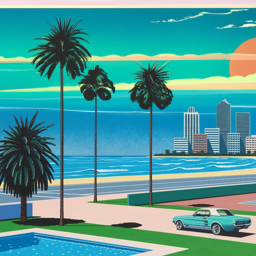

In [79]:
image_to_edit = "images/American_Gothic_Square.png"
image_to_edit = "images/nuggets.jpg"
#image_to_edit = "images/twofridas.jpeg"
image_to_edit = "images/Nagai_Beach.png"
image_to_edit = "images/toucan_GGB.png"
image_to_edit = "images/nagai_beach_edit1.png"
im = Image.open(image_to_edit)
display(im)

showing cropped png


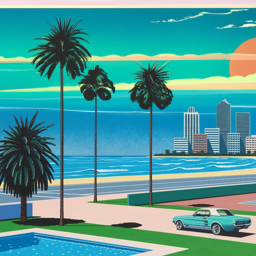

In [80]:
# crop image: 
def load_and_crop_image(image_path, desired_size):
    # Load the image
    img = Image.open(image_path)

    # Calculate the crop parameters
    width, height = img.size   # Get dimensions
    min_dim = min(width, height)

    # Calculate the area to be cropped
    left = (width - min_dim)/2
    top = (height - min_dim)/2
    right = (width + min_dim)/2
    bottom = (height + min_dim)/2

    # Crop the image
    img_cropped = img.crop((left, top, right, bottom))

    # Resize the image to the desired size
    img_square = img_cropped.resize((desired_size, desired_size))

    return img_square

# Usage
image_path = image_to_edit  # change this to your image path
desired_size = 256  # change this to your desired size
square_image = load_and_crop_image(image_path, desired_size)


def write_image_as_png(img, original_image_path):
    # Create new file path by replacing the old file extension with .png
    new_path = original_image_path.rsplit('.', 1)[0] + ".png"
    img.save(new_path)
    return(new_path)

# Usage
square_image = load_and_crop_image(image_path, desired_size)
square_png_path = write_image_as_png(square_image, image_path)
im = Image.open(square_png_path)
print("showing cropped png")
display(im)




## Use GPT-3 to generate a list of art styles to remix American Gothic

In [81]:
# The question you want to ask GPT-3
question = "provide a python list of 15 distinct art styles (i.e. impressionist, cubist, pointlist, photorealistic, japanese wood block print)"
# Join the description and question into a single string
prompt = f"{question}"
gpt_output = ask_gpt(prompt)
# Parse the output
art_styles_string = gpt_output.choices[0]['text']
art_styles = [line.split('. ')[1] for line in art_styles_string.split('\n') if line]
# choose the length of combinations you want, for example 2
length_of_combinations = 2
style_combinations = list(itertools.combinations(art_styles, length_of_combinations))

APIConnectionError: Error communicating with OpenAI: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))

In [82]:
user_input = "sunset leather patina background"
# Format the GPT output for Dalle prompt
formatted_strings = []

for combination in style_combinations:
    style_1, style_2 = combination
    formatted_string = f"in the style of {style_1} and {style_2} and {user_input}"
    formatted_strings.append(formatted_string)

for string in formatted_strings[50:70]:
    print(string)


in the style of Japanese Wood Block Print and Expressionism and sunset leather patina background
in the style of Japanese Wood Block Print and Abstract and sunset leather patina background
in the style of Japanese Wood Block Print and Pop Art and sunset leather patina background
in the style of Japanese Wood Block Print and Surrealism and sunset leather patina background
in the style of Japanese Wood Block Print and Figurative and sunset leather patina background
in the style of Japanese Wood Block Print and Naive Art and sunset leather patina background
in the style of Japanese Wood Block Print and Fauvism and sunset leather patina background
in the style of Japanese Wood Block Print and Constructivism and sunset leather patina background
in the style of Japanese Wood Block Print and Op Art and sunset leather patina background
in the style of Japanese Wood Block Print and Dadaism and sunset leather patina background
in the style of Expressionism and Abstract and sunset leather patina 

## Create Masks


In [83]:
edit_dir_name = image_to_edit.split("/")[-1].split(".")[0]

In [84]:
mask_dir = "images/masks"
# create the directory if it doesn't yet exist
if not os.path.isdir(mask_dir):
    os.mkdir(mask_dir)
# print the directory to save to
print(f"{mask_dir=}")

# TODO ask what are the actual image sizes 
width = 256
height = 256

mask_dir = "./masks"
os.makedirs(mask_dir, exist_ok=True)  # ensure the directory exists
top_half_mask(width, height, mask_dir, "top_half_mask.png")
bottom_half_mask(width, height, mask_dir, "bottom_half_mask.png")
left_half_mask(width, height, mask_dir, "left_half_mask.png")
right_half_mask(width, height, mask_dir, "right_half_mask.png")
full_mask(width, height, mask_dir, "full_mask.png")
coverage = 0.8  # Coverage of the mask (0.5 = 50%)
create_circular_mask(width, height, mask_dir, f"circle_mask_{coverage}.png", coverage)
# specify edit images dir
edit_image_dir = os.path.join("images", "edits", edit_dir_name)

mask_dir='images/masks'


In [85]:
os.makedirs(f"{edit_image_dir}", exist_ok=True)

## Call DALE API using a random mask of the 4 halves of the image, and a random combination of styles

In [89]:
# TODO: find best way to add style tags to generated images in their metadata or just their filename
# Specify the directory
mask_dir = "./masks/"
# Get the list of all masks in the directory
masks = [f for f in os.listdir(mask_dir) if f.startswith('l')]


In [90]:
formatted_strings[:10]

['in the style of Impressionism and Cubism and sunset leather patina background',
 'in the style of Impressionism and Pointillism and sunset leather patina background',
 'in the style of Impressionism and Photorealism and sunset leather patina background',
 'in the style of Impressionism and Japanese Wood Block Print and sunset leather patina background',
 'in the style of Impressionism and Expressionism and sunset leather patina background',
 'in the style of Impressionism and Abstract and sunset leather patina background',
 'in the style of Impressionism and Pop Art and sunset leather patina background',
 'in the style of Impressionism and Surrealism and sunset leather patina background',
 'in the style of Impressionism and Figurative and sunset leather patina background',
 'in the style of Impressionism and Naive Art and sunset leather patina background']

In [92]:
# specify the number of iterations
num_iterations = 8
# Iterate for the number of specified iterations
for i in range(num_iterations):
    # Select a random mask
    selected_mask = random.choice(masks)
    # Get the full file path of the selected mask
    mask_filepath = os.path.join(mask_dir, selected_mask)

    # Select a random style combination
    selected_prompt = random.choice(formatted_strings[10:25])

    edit_response = openai.Image.create_edit(
        image=open(square_png_path, "rb"),  # local american gothic image
        mask=open(mask_filepath, "rb"),  # from right above
        prompt=selected_prompt,  # from the generation section
        n=1,
        size="256x256",
        response_format="url",
    )
    
    # print(edit_response)
    edit_filepaths = process_dalle_images(edit_response, "edits", edit_image_dir, i, hash = True)


## Plot the generated images in a collage

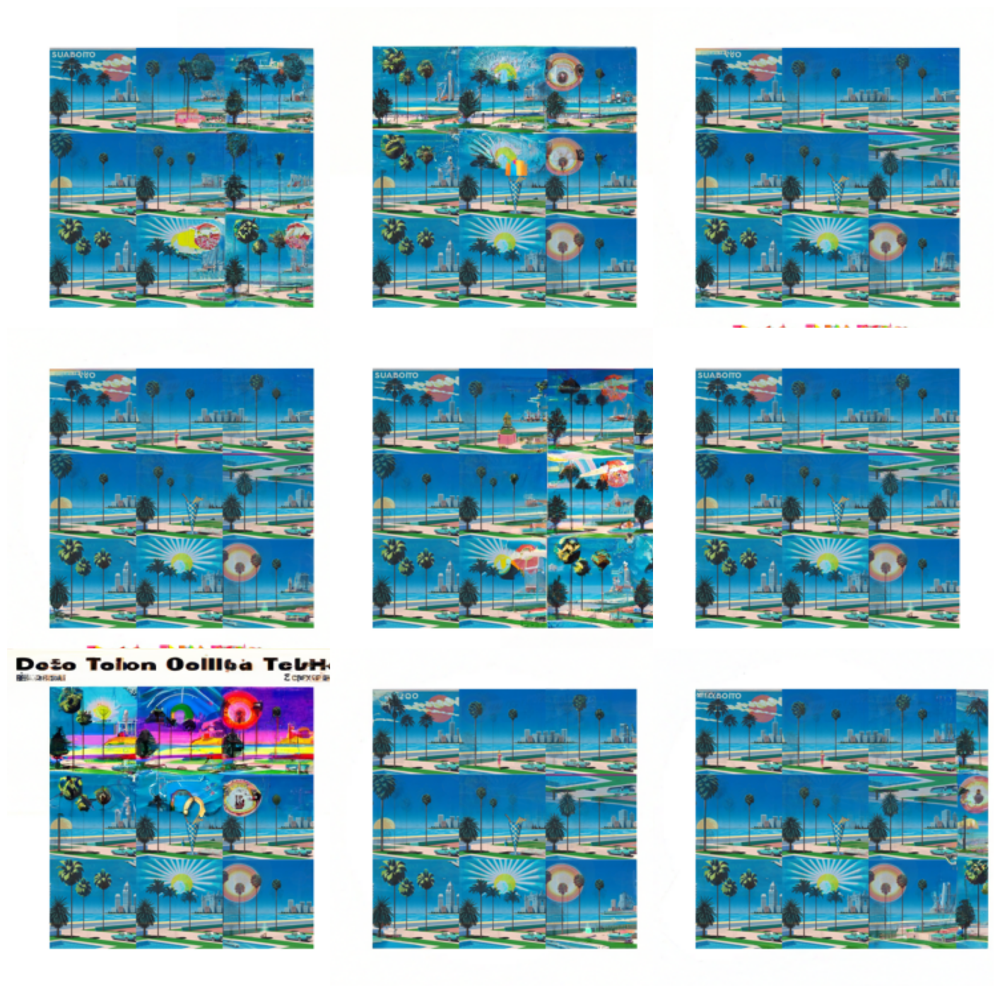

In [78]:
def plot_images(num_images, edit_image_dir, output_dir, output_file):
    # Specify the directory
    image_directory = edit_image_dir + "/"
    image_files = [f for f in os.listdir(image_directory) if f.endswith('.png')]
    
    # shuffle image file order to get different images in the plot
    np.random.shuffle(image_files)
    
    # Load all the images
    images = [Image.open(image_directory + f) for f in image_files]
    
    # Repeat the list of images to ensure we have enough to plot
    while len(images) < num_images:
        images += images
    
    # Create a 10x10 plot
    fig, axes = plt.subplots(3, 3, figsize=(18, 18))
    
    for idx in range(num_images):
        # Determine position in grid, loop back to the start if idx >= 100
        i = (idx // 3) % 3
        j = (idx % 3) % 3
        
        # Get the image
        img = images[idx]
        
        # Remove the axes for each subplot
        axes[i, j].axis('off')
        
        # Display the image on the subplot, with alpha setting if more than 100 images
        alpha_val = 1 if idx < 100 else num_images / (num_images * 1)
        axes[i, j].imshow(np.array(img), alpha=alpha_val, aspect='auto')

    # Adjust the space between the subplots
    # Negative values for wspace and hspace will make the images overlap
    plt.subplots_adjust(wspace=-0.05, hspace=-0.05)
    
    # Save the plot
    output_path = os.path.join(output_dir, output_file)
    plt.savefig(output_path, dpi=300)

# Usage
num_images = 300 # Number of images to be plotted
rotation = 0 # max rotation angle in degrees
output_dir = f'collages/{edit_dir_name}' # Output directory
os.makedirs(f"{output_dir}", exist_ok=True)
output_file = f'collage1.png' # Output file name
plot_images(num_images, edit_image_dir, output_dir, output_file)


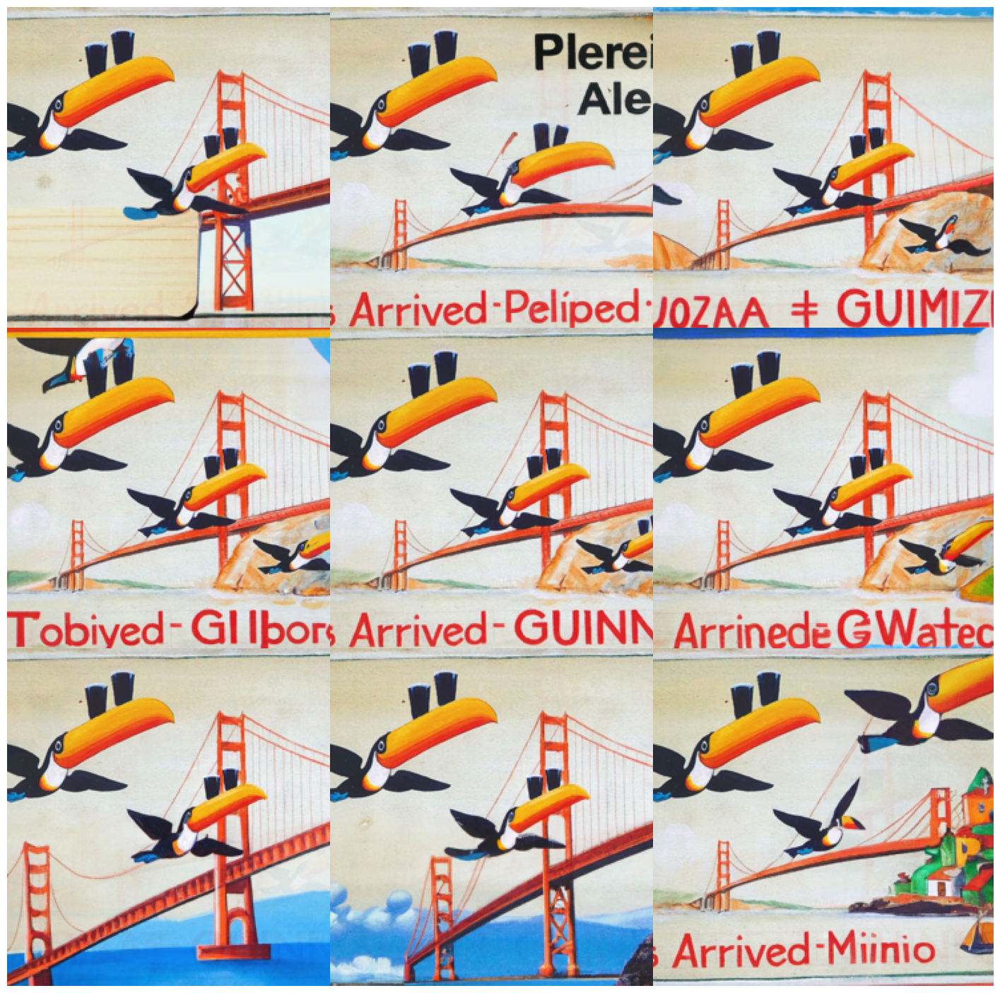

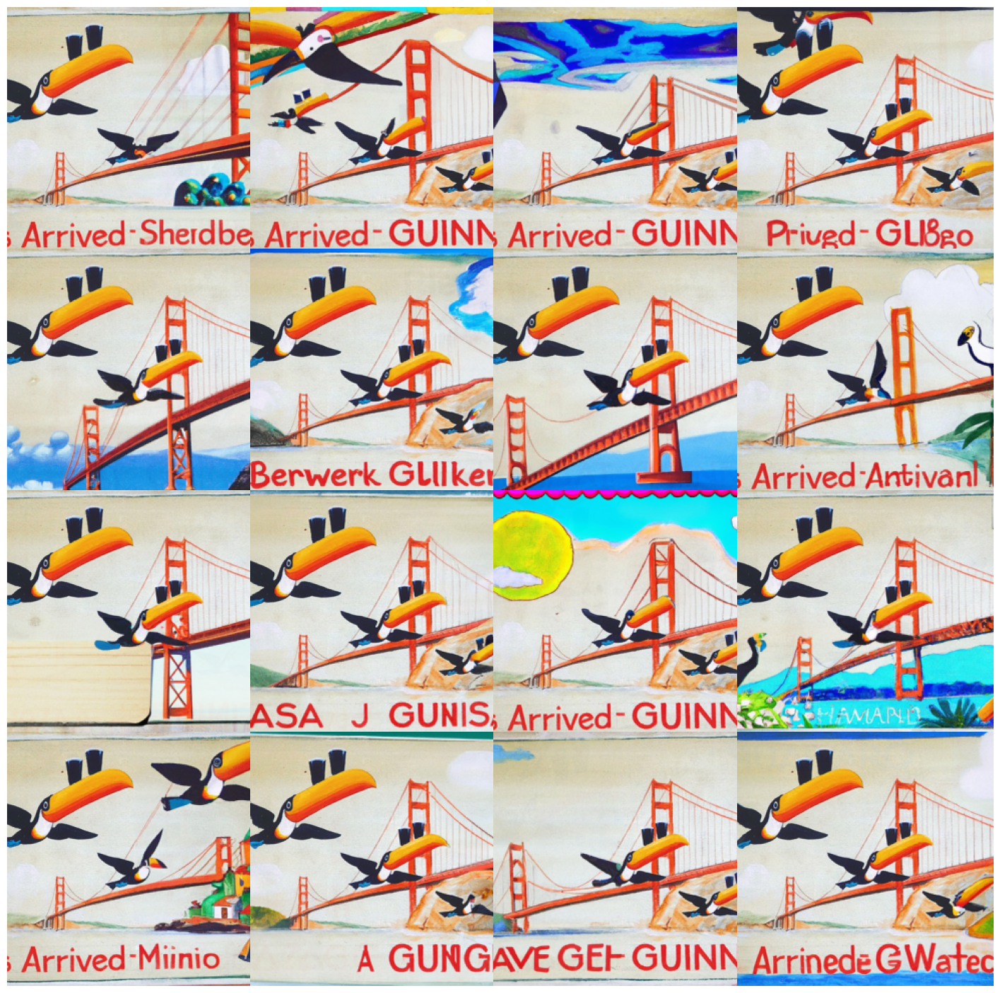

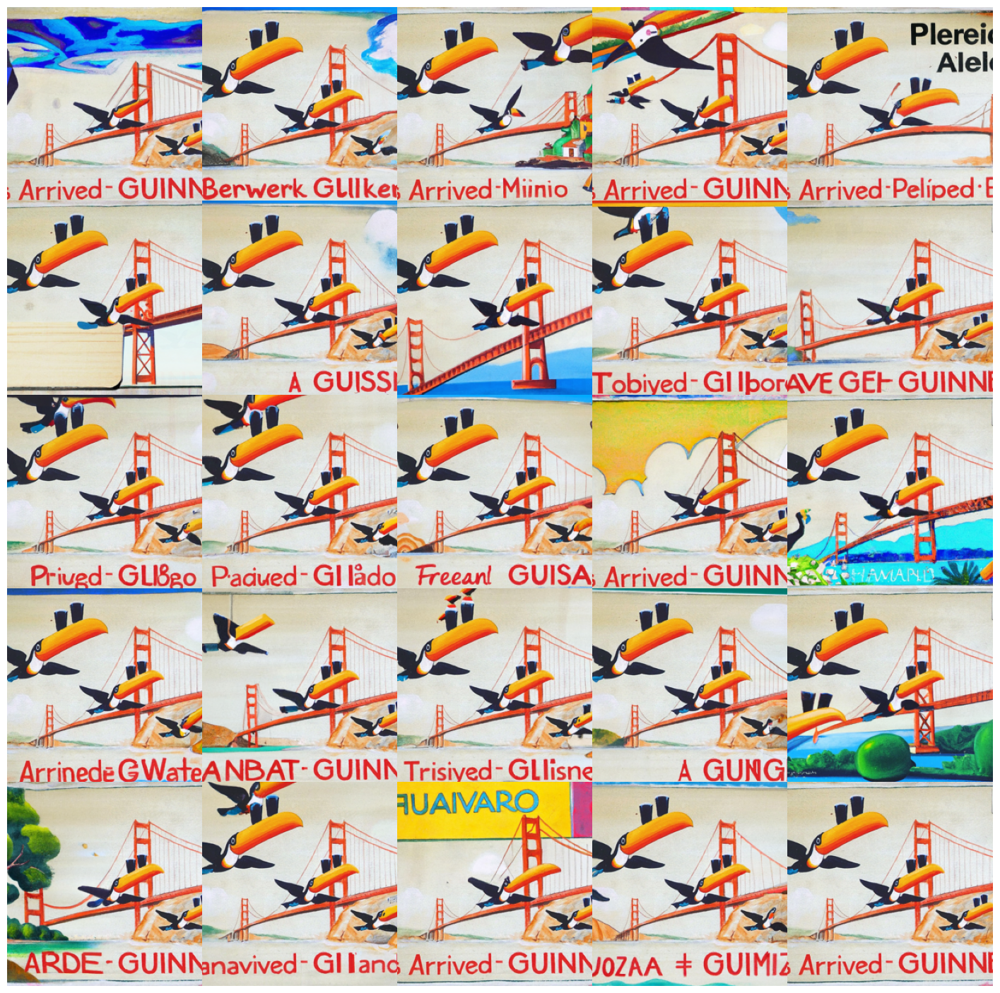

In [67]:
def plot_images(num_images, edit_image_dir, rotation, output_dir, output_file, grid_size):
    # Specify the directory
    image_directory = edit_image_dir + "/"
    image_files = [f for f in os.listdir(image_directory) if f.endswith('.png')]
    
    # shuffle image file order to get different images in the plot
    np.random.shuffle(image_files)
    
    # Load all the images
    images = [Image.open(image_directory + f) for f in image_files]
    
    # Repeat the list of images to ensure we have enough to plot
    while len(images) < num_images:
        images += images
    
    # Create a grid_size x grid_size plot
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(18, 18))
    
    for idx in range(num_images):
        # Determine position in grid, loop back to the start if idx >= grid_size*grid_size
        i = (idx // grid_size) % grid_size
        j = (idx % grid_size) % grid_size
        
        # Get the image
        img = images[idx]
        
        # Rotate the image only on second iteration through the grid
        if idx >= grid_size*grid_size:
            img = img.rotate(np.random.uniform(-rotation,rotation))
        
        # Remove the axes for each subplot
        axes[i, j].axis('off')
        
        # Display the image on the subplot, with alpha setting if more than grid_size*grid_size images
        alpha_val = 1 if idx < grid_size*grid_size else num_images / (num_images * 50)
        axes[i, j].imshow(np.array(img), alpha=alpha_val, aspect='auto')

    # Adjust the space between the subplots
    # Negative values for wspace and hspace will make the images overlap
    plt.subplots_adjust(wspace=-0.05, hspace=-0.05)
    
    # Save the plot
    output_path = os.path.join(output_dir, output_file)
    plt.savefig(output_path, dpi=300)

# Usage
    output_dir = f'collages/{edit_dir_name}' # Output directory
    os.makedirs(f"{output_dir}", exist_ok=True)
for i in range(3,6):
    # Usage
    num_images = 36 # Number of images to be plotted
    rotation = 0 # max rotation angle in degrees
    output_file = f'collage_{i}.png' # Output file name
    plot_images(num_images, edit_image_dir, rotation, output_dir, output_file, grid_size=i)


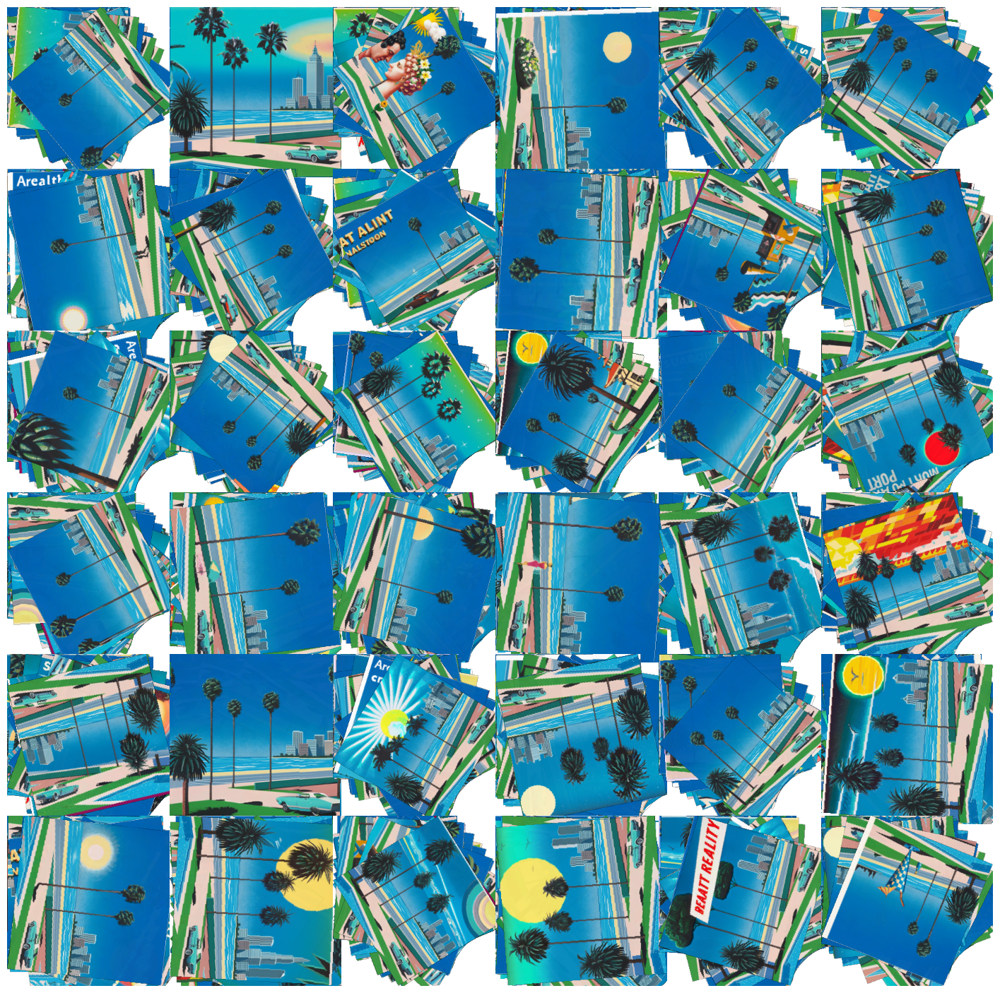

In [156]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

def plot_images(num_images, edit_image_dir, rotation, output_dir, output_file, grid_size):
    # Specify the directory
    image_directory = edit_image_dir + "/"
    image_files = [f for f in os.listdir(image_directory) if f.endswith('.png')]
    
    # shuffle image file order to get different images in the plot
    np.random.shuffle(image_files)
    
    # Load all the images
    images = [Image.open(image_directory + f) for f in image_files]
    
    # Repeat the list of images to ensure we have enough to plot
    while len(images) < num_images:
        images += images
    
    # Create a grid_size x grid_size plot
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(18, 18))
    
    # Create a 2D array to keep track of which subplots already have an image
    filled_subplots = np.zeros((grid_size, grid_size), dtype=int)
    
    for idx in range(num_images):
        # Determine position in grid, loop back to the start if idx >= grid_size*grid_size
        i = (idx // grid_size) % grid_size
        j = (idx % grid_size) % grid_size
        
        # Get the image
        img = images[idx]
        
        # Rotate the image and set black pixels to transparent only on second iteration through the grid
        if filled_subplots[i, j] > 0:
            img = img.rotate(np.random.uniform(-rotation,rotation), expand=True)
            
            # Convert the image to an RGBA image
            img_rgba = img.convert("RGBA")
            
            # Get a numpy array of the image's pixels
            data = np.array(img_rgba)
            
            # Create a mask of all the black (also shades near black) pixels in the image
            mask = np.all(data<=[15,15,15,255], axis=-1)
            
            # Change all black (also shades near black) pixels to be transparent
            data[mask] = [0, 0, 0, 0]

            # Increase the transparency as more images are overlaid
            data[..., -1] = data[..., -1] * (1 - (filled_subplots[i, j] / num_images))
            
            # Convert the numpy array back to an image
            img = Image.fromarray(data)

        # Increase the count of filled subplot
        filled_subplots[i, j] += 1
        
        # Remove the axes for each subplot
        axes[i, j].axis('off')
        
        # Display the image on the subplot
        axes[i, j].imshow(np.array(img), aspect='auto')

    # Adjust the space between the subplots
    plt.subplots_adjust(wspace=-0.05, hspace=-0.05)
    
    # Save the plot
    output_path = os.path.join(output_dir, output_file)
    plt.savefig(output_path, dpi=300)

# Usage
num_images = 825 # Number of images to be plotted
rotation = 360 # max rotation angle in degrees
output_dir = './' # Output directory
output_file = 'output.png' # Output file name
grid_size = 6 # Size of grid to be plotted
plot_images(num_images, edit_image_dir, rotation, output_dir, output_file, grid_size)
